In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import matplotlib.pyplot as plt
from torch.optim import Adam
import pandas as pd
import random
import os
import numpy as np
from torchinfo import summary
from torch.nn.utils.rnn import pack_padded_sequence
from transformers import GPT2TokenizerFast, GPT2Config
from torch.nn.utils.rnn import pad_sequence
import sys
from torch.nn.parallel import DataParallel
import pickle

In [2]:
gray_rgb = transforms.Compose([
    transforms.Lambda(lambda x: torch.cat([x, x, x], 0))
])
transform = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.RandomRotation(degrees=(-10, 10)),
    transforms.RandomResizedCrop(size=(299, 299), scale=(0.5, 1.0)),  # RandomCrop with random ratio
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

tokenizer = GPT2TokenizerFast.from_pretrained('gpt2')
tokenizer.add_special_tokens({'bos_token': '<BOS>', 'eos_token': '<EOS>', 'pad_token': '<PAD>'})

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

3

In [3]:
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, root_dir, csv_file, transform=None, cap_preproc=None):
        self.root_dir = root_dir
        self.df = pd.read_csv(csv_file)
        self.transform = transform
        self.cap_preproc = cap_preproc

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        img_name = os.path.join(self.root_dir, self.df.iloc[idx, 1])
        image = Image.open(img_name).convert('RGB')
        caption = self.df.iloc[idx, 2]
        
        if image.mode == 'L':
            image = gray_rgb(image)
        
        caption = f'<BOS> {caption} <EOS>'
        
        caption_embedding = tokenizer(caption)['input_ids']
        
        label_embedding = caption_embedding[1:]

        if self.transform:
            image = self.transform(image)
        # Convert caption to a tensor"
#         caption = torch.tensor(caption)  # Add this line

        return torch.tensor(image), torch.tensor(caption_embedding), torch.tensor(label_embedding)


In [4]:
train_data = CustomDataset(root_dir='/kaggle/input/image-captioning/custom_captions_dataset/train', csv_file='/kaggle/input/image-captioning/custom_captions_dataset/train.csv', transform=transform)
val_data = CustomDataset(root_dir='/kaggle/input/image-captioning/custom_captions_dataset/val', csv_file='/kaggle/input/image-captioning/custom_captions_dataset/val.csv', transform=transform)
test_data = CustomDataset(root_dir='/kaggle/input/image-captioning/custom_captions_dataset/test', csv_file='/kaggle/input/image-captioning/custom_captions_dataset/test.csv', transform=transform) 


In [5]:
def show_random_images(dataset, num_images=10):
    random_indices = random.sample(range(len(dataset)), num_images)
    for idx in random_indices:
        image, caption = dataset[idx]
        print("Caption:", caption)
        # Convert tensor to PIL image
        image = transforms.ToPILImage()(image)
        image.show()  # Show the image


/tmp/ipykernel_26/2520714760.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(image), torch.tensor(caption_embedding), torch.tensor(label_embedding)


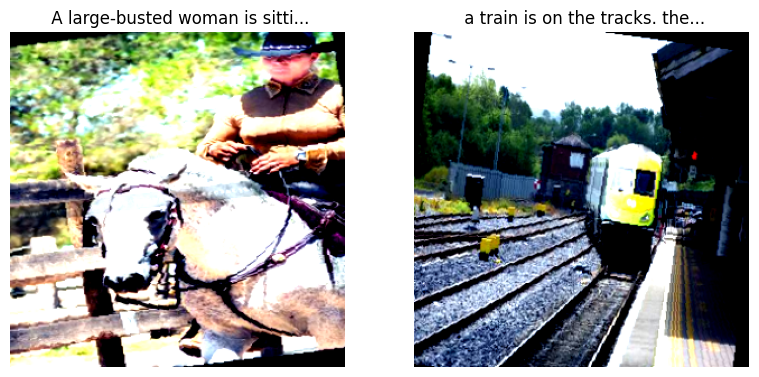

In [6]:
# Set the seed for reproducibility
torch.manual_seed(42)

# Create a figure for plotting
fig = plt.figure(figsize=(20, 20))

# Define the number of images you want to display
num_images = 2

# Define the maximum length for the captions
max_length = 30

for i in range(num_images):
    # Choose a random index for a sample in the dataset
    idx = random.randint(0, len(train_data) - 1)

    # Retrieve the image and caption at the random index
    img, caption, _ = train_data[idx]
    caption = tokenizer.decode(caption, skip_special_tokens=True)


    # Un-normalize the image
    img = img / 2 + 0.5
    img = img.numpy().transpose((1, 2, 0))

    # If the caption is longer than the maximum length, truncate it
    if len(caption) > max_length:
        caption = caption[:max_length] + '...'
    

    # Create a subplot in the figure for the current image
    ax = fig.add_subplot(4, 4, i + 1)

    # Plot the image
    ax.imshow(img)

    # Set the title of the subplot to the corresponding caption
    ax.set_title(caption)

    # Remove the x and y ticks
    ax.axis('off')

# Display the plot
plt.show()


In [7]:
def collate_fn(batch):
    image = [i[0] for i in batch]
    input_ids = [i[1] for i in batch]
    labels = [i[2] for i in batch]
    image = torch.stack(image,dim=0)
    input_ids = tokenizer.pad(
        {'input_ids':input_ids},
        padding='longest',
        return_attention_mask=False,
        return_tensors='pt'
    )['input_ids']
    labels = tokenizer.pad(
        {'input_ids':labels},
        padding='longest',
        return_attention_mask=False,
        return_tensors='pt'
    )['input_ids']
    mask = (input_ids!=tokenizer.pad_token_id).long()
    return image, input_ids, labels

In [8]:
batch_size = 4

train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)
val_loader = DataLoader(val_data, batch_size=batch_size, shuffle=False, collate_fn=collate_fn)
test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False, collate_fn=collate_fn)

print(f"Length of train dataloader: {len(train_loader)} batches of {batch_size}")
print(f"Length of val dataloader: {len(val_loader)} batches of {batch_size}")
print(f"Length of test dataloader: {len(test_loader)} batches of {batch_size}")

Length of train dataloader: 1429 batches of 4
Length of val dataloader: 237 batches of 4
Length of test dataloader: 232 batches of 4


In [9]:
class EncoderCNN(nn.Module):
    def __init__(self, embed_size, train_CNN=False):
        super(EncoderCNN, self).__init__()
        self.inception = models.inception_v3(weights='Inception_V3_Weights.DEFAULT')
#         self.inception.load_state_dict(torch.load('/kaggle/input/inceptionv3/pytorch/inceptionv3/1/inception_v3_google-0cc3c7bd.pth'))
        for param in self.inception.parameters():
            param.requires_grad = False
        # Modify the classifier of Inception-v3
        in_features = self.inception.fc.in_features
        self.inception.fc = nn.Linear(in_features, 2048)
        
        num_ftrs = self.inception.AuxLogits.fc.in_features
        self.inception.AuxLogits.fc = nn.Linear(num_ftrs, 2)
        
        self.resnet = models.resnet50(weights='ResNet50_Weights.DEFAULT')
#         self.resnet.load_state_dict(torch.load('/kaggle/input/resnet50/pytorch/resnet50/1/resnet50-0676ba61.pth'))
        for param in self.resnet.parameters():
            param.requires_grad = False
        # Modify the classifier of ResNet-50
        in_features = self.resnet.fc.in_features
        self.resnet.fc = nn.Linear(in_features, 2048)
        
        self.fc = nn.Linear(4096, embed_size)

    def forward(self, images, train_CNN=False):
        
        inception_out = self.inception(images)
        
        
        # Forward pass through ResNet-50
        resnet_out = self.resnet(images)
        
#         print(inception_out.shape,resnet_out.shape)
        
        inception_out = F.relu(inception_out, inplace=True)
        resnet_out = F.relu(resnet_out, inplace=True)
        
#         print(inception_out.shape,resnet_out.shape)
        # Concatenate features from both networks
        combined_out = torch.cat((inception_out, resnet_out), dim=1)
        
        # Forward pass through the combined classifier
        output = self.fc(combined_out)
        return output


In [10]:
class DecoderRNN(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers=1):
        super(DecoderRNN, self).__init__()
        
        # define the properties
        self.embed_size = embed_size
        self.hidden_size = hidden_size
        self.vocab_size = vocab_size
        
        # lstm cell
        self.lstm_cell = nn.LSTMCell(input_size=embed_size, hidden_size=hidden_size)
    
        # output fully connected layer
        self.fc_out = nn.Linear(in_features=self.hidden_size, out_features=self.vocab_size)
    
        # embedding layer
        self.embed = nn.Embedding(num_embeddings=self.vocab_size, embedding_dim=self.embed_size)
    
        # activations
        self.softmax = nn.Softmax(dim=1)
    
    def forward(self, features, captions):
        
        # batch size
        batch_size = features.size(0)
        
        # init the hidden and cell states to zeros
        hidden_state = torch.zeros((batch_size, self.hidden_size)).cuda()
        cell_state = torch.zeros((batch_size, self.hidden_size)).cuda()
    
        # define the output tensor placeholder
        outputs = torch.empty((batch_size, captions.size(1), self.vocab_size)).cuda()

        # embed the captions
        captions_embed = self.embed(captions)
        
        # pass the caption word by word
        for t in range(captions.size(1)):

            # for the first time step the input is the feature vector
            if t == 0:
                hidden_state, cell_state = self.lstm_cell(features, (hidden_state, cell_state))
                
            # for the 2nd+ time step, using teacher forcer
            else:
                hidden_state, cell_state = self.lstm_cell(captions_embed[:, t, :], (hidden_state, cell_state))
            
            # output of the attention mechanism
            out = self.fc_out(hidden_state)
            
            # build the output tensor
            outputs[:, t, :] = out
    
        return outputs

In [11]:
from transformers import GPT2Config

# Load the configuration of the desired GPT-2 variant
config = GPT2Config.from_pretrained("gpt2")

# Access the vocabulary size
vocab_size = config.vocab_size

In [12]:
# Hyperparameters
embed_size = 512
hidden_size = 512
vocab_size = vocab_size+3
num_layers = 1
num_epochs = 11
batch_size = 8
learning_rate = 0.001
save_every = 1

In [13]:
encoder = EncoderCNN(embed_size)
decoder = DecoderRNN(embed_size, embed_size, vocab_size)

# encoder = nn.DataParallel(encoder)
# decoder = nn.DataParallel(decoder)

criterion = nn.CrossEntropyLoss()
params = decoder.parameters()
optimizer = Adam(params, lr=learning_rate)

Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:00<00:00, 150MB/s] 
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 169MB/s]


In [14]:
def onehot(arr):
    batch, length = arr.shape[0], arr.shape[1]
    n_arr = torch.zeros(batch, length, vocab_size)
    for i, tokens in enumerate(arr):
        for j, token in enumerate(tokens):
            n_arr[i][j][token] = 1
    return n_arr

In [15]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# get the losses for vizualization
losses = list()
val_losses = list()

encoder.to(device)
decoder.to(device)

best_model = None
best_val = np.inf

for epoch in range(1, num_epochs+1):
    train_loss = 0
    for i_step, (images, captions, labels) in enumerate(train_loader):
        
        # zero the gradients
        decoder.zero_grad()
        encoder.zero_grad()
        
        # set decoder and encoder into train mode
        encoder.eval()
        decoder.train()
        
#         # Randomly sample a caption length, and sample indices with that length.
#         indices = train_loader.dataset.get_train_indices()
        
#         # Create and assign a batch sampler to retrieve a batch with the sampled indices.
#         new_sampler = data.sampler.SubsetRandomSampler(indices=indices)
#         train_loader.batch_sampler.sampler = new_sampler
        
        # make the captions for targets and teacher forcer
#         print(captions.shape, labels.shape)
#         print(tokenizer.decode(captions[0], skip_special_tokens=False))
        captions_target = labels.to(device)
        captions_train = captions[:, :captions.shape[1]-1].to(device)
        
        # Move batch of images and captions to GPU if CUDA is available.
        images = images.to(device)
#         print(images.shape)
        
        # Pass the inputs through the CNN-RNN model.
        features = encoder(images)
        outputs = decoder(features, captions_train)
        
#         print(outputs.shape, captions_target.shape, captions_train.shape)
#         print(outputs.view(-1, vocab_size).shape, onehot(captions_target).view(-1, vocab_size).shape)
        
        # Calculate the batch loss
        loss = criterion(outputs.view(-1, vocab_size), onehot(captions_target).view(-1, vocab_size).to(device))
        train_loss += loss.item()
        
        # Backward pass
        loss.backward()
        
        # Update the parameters in the optimizer
        optimizer.step()
        if i_step % 50 == 0:
            stats = 'Step [%d/%d], Train Loss: %.4f' % (i_step, len(train_loader), train_loss)

            # Print training statistics (on same line).
            print(stats)
        
        # - - - Validate - - -
        # turn the evaluation mode on
    with torch.no_grad():

        # set the evaluation mode
        encoder.eval()
        decoder.eval()

        tmp = 0
        for j_step, (val_images, val_captions, val_labels) in enumerate(val_loader):

            # define the captions

            captions_target = val_labels.to(device)
            captions_train = val_captions[:, :val_captions.shape[1]-1].to(device)

            # Move batch of images and captions to GPU if CUDA is available.
            val_images = val_images.to(device)
#                 print(val_images.shape)

            # Pass the inputs through the CNN-RNN model.
            features = encoder(val_images, train_CNN=True)
            outputs = decoder(features, captions_train)

            # Calculate the batch loss.
            val_loss = criterion(outputs.view(-1, vocab_size), onehot(captions_target).view(-1, vocab_size).to(device))
            tmp += val_loss.item()
            if j_step % 50 == 0:
                stats = 'Step [%d/%d], Val Loss: %.4f' % (j_step, len(val_loader), tmp)
                print()
                print('-'*30)
                print(tokenizer.decode(captions_target[0], skip_special_tokens=True))
                print('+'*30)
                print(tokenizer.decode(outputs.argmax(axis=2)[0], skip_special_tokens=True))
                print('-'*30)
                print()
                # Print training statistics (on same line).
                print(stats)

    # append the validation loss and training loss
    val_losses.append(tmp)
    losses.append(train_loss)

    # save the losses
    np.save('losses', np.array(losses))
    np.save('val_losses', np.array(val_losses))
    
    if tmp < best_val:
        best_val = tmp
        best_model = decoder.state_dict()

    # Get training statistics.
    if epoch % save_every == 0:
        stats = 'Epoch [%d/%d], Step [%d/%d], Loss: %.4f, Val Loss: %.4f' % (epoch, num_epochs, i_step, len(train_loader), loss.item(), tmp)

        # Print training statistics (on same line).
        print(stats)
            
    

/tmp/ipykernel_26/2520714760.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(image), torch.tensor(caption_embedding), torch.tensor(label_embedding)
You're using a GPT2TokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.
2024-04-17 07:14:25.352884: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-17 07:14:25.352973: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-17 07:14:25.474209: 

Step [0/1429], Train Loss: 10.8361


/tmp/ipykernel_26/2520714760.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(image), torch.tensor(caption_embedding), torch.tensor(label_embedding)


Step [50/1429], Train Loss: 273.8202
Step [100/1429], Train Loss: 465.0163
Step [150/1429], Train Loss: 636.4541
Step [200/1429], Train Loss: 798.8431
Step [250/1429], Train Loss: 959.7708
Step [300/1429], Train Loss: 1115.3671
Step [350/1429], Train Loss: 1265.0243
Step [400/1429], Train Loss: 1418.9028
Step [450/1429], Train Loss: 1567.2504
Step [500/1429], Train Loss: 1712.9944
Step [550/1429], Train Loss: 1861.9693
Step [600/1429], Train Loss: 1995.6146
Step [650/1429], Train Loss: 2130.3294
Step [700/1429], Train Loss: 2269.1853
Step [750/1429], Train Loss: 2401.3461
Step [800/1429], Train Loss: 2535.8750
Step [850/1429], Train Loss: 2673.9315
Step [900/1429], Train Loss: 2802.1510
Step [950/1429], Train Loss: 2936.9932
Step [1000/1429], Train Loss: 3067.3915
Step [1050/1429], Train Loss: 3193.6408
Step [1100/1429], Train Loss: 3324.7876
Step [1150/1429], Train Loss: 3452.0917
Step [1200/1429], Train Loss: 3579.6386
Step [1250/1429], Train Loss: 3701.4797
Step [1300/1429], Train L

In [16]:
torch.save(best_model, 'best_model.pth')

In [17]:
with torch.no_grad():
    # set the evaluation mode
    encoder.eval()
    decoder.load_state_dict(torch.load('/kaggle/working/best_model.pth'))
    decoder.eval()
    encoder.to(device)
    decoder.to(device)

    tmp = 0
    y_pred = []
    y_test = []
    for j_step, (test_images, test_captions, test_labels) in enumerate(test_loader):

        # define the captions

        captions_target = test_labels.to(device)
        captions_train = test_captions[:, :test_captions.shape[1]-1].to(device)

        # Move batch of images and captions to GPU if CUDA is available.
        test_images = test_images.to(device)
#                 print(val_images.shape)

        # Pass the inputs through the CNN-RNN model.
        features = encoder(test_images, train_CNN=True)
        outputs = decoder(features, captions_train)
        
        for j, caption in enumerate(outputs.argmax(axis=2)):
            y_pred.append(tokenizer.decode(caption, skip_special_tokens=True))
            y_test.append(tokenizer.decode(captions_target[j], skip_special_tokens=True))
            
        # Calculate the batch loss.
        test_loss = criterion(outputs.view(-1, vocab_size), onehot(captions_target).view(-1, vocab_size).to(device))
        tmp += test_loss.item()
        if j_step % 50 == 0:
            stats = 'Step [%d/%d], Test Loss: %.4f' % (j_step, len(test_loader), tmp)
            print()
            print('-'*30)
            print(tokenizer.decode(captions_target[0], skip_special_tokens=True))
            print('+'*30)
            print(tokenizer.decode(outputs.argmax(axis=2)[0], skip_special_tokens=True))
            print('-'*30)
            print()
            # Print training statistics (on same line).
            print(stats)

/tmp/ipykernel_26/2520714760.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(image), torch.tensor(caption_embedding), torch.tensor(label_embedding)



------------------------------
 A large building with bars on the windows in front of it. There is people walking in front of the building. There is a street in front of the building with many cars on it.  
++++++++++++++++++++++++++++++
 A man white sits many on it top of the of it. The is a in on the of the building. There is a large light front of the building with windows windows on it. There
------------------------------

Step [0/232], Test Loss: 2.2166

------------------------------
 Its the inside of a very large cathedral. It is massive and beautiful. There are a large amount of rows of seats on both sides. The beams on the inside on both sides are white and large. There are gold candle items hanging from the ceiling. 
++++++++++++++++++++++++++++++
 A a two is a small happy ceramic colored the is a in has with The are two few white of clouds of green they the the. There pool is the left is the sides is in. there. The is some swirling on in on the ceiling. 
-----------------

/tmp/ipykernel_26/3373497975.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  test_img, test_caption = row[1], row[2]


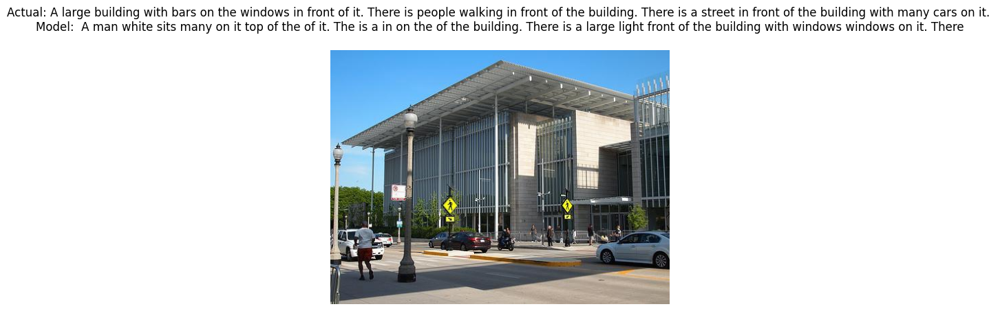

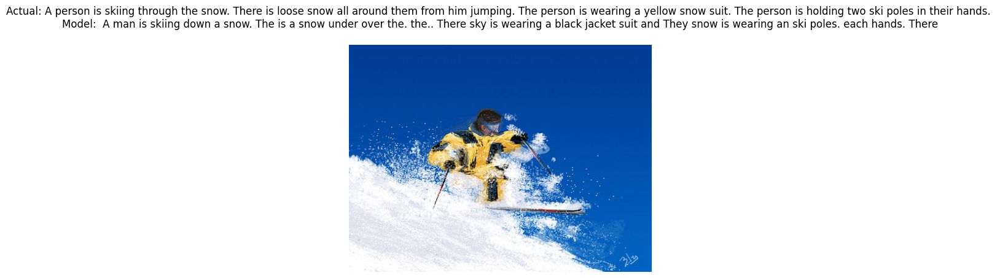

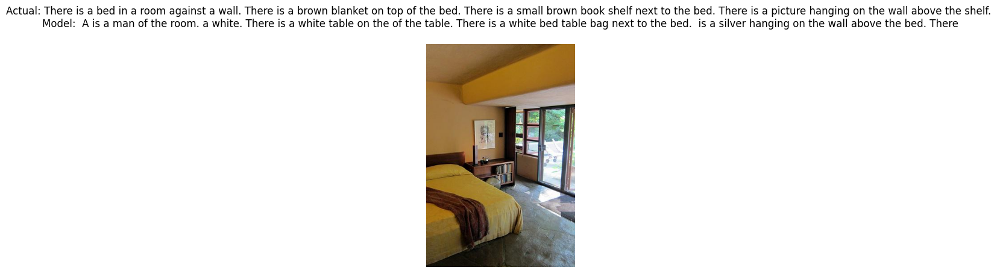

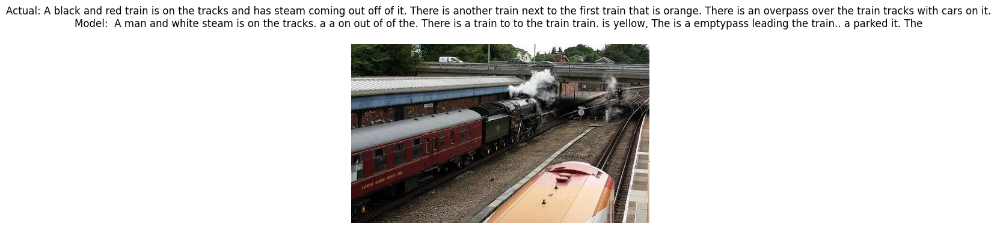

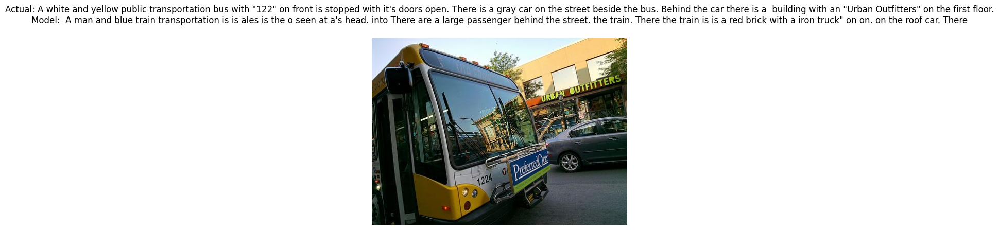

...

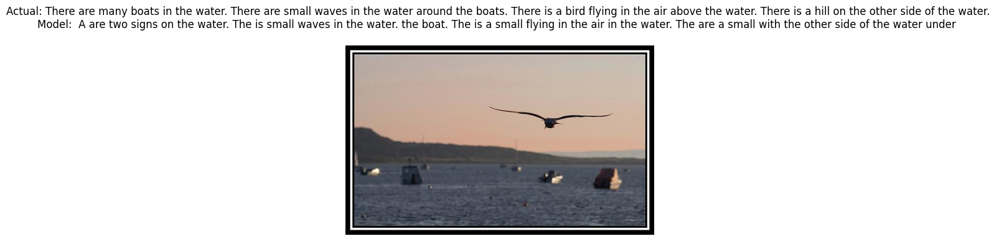

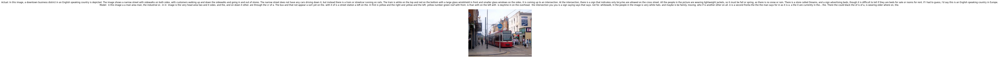

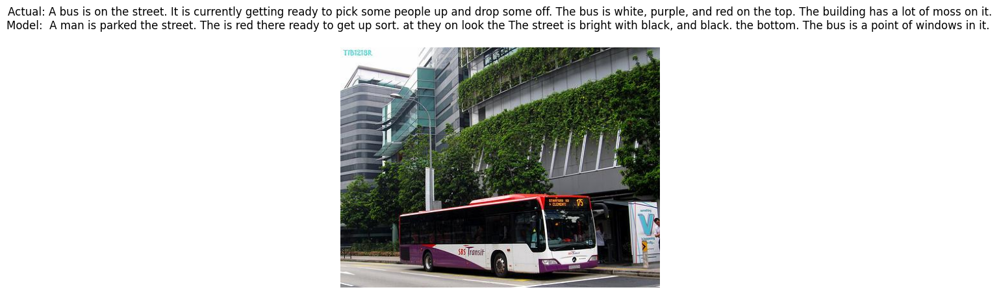

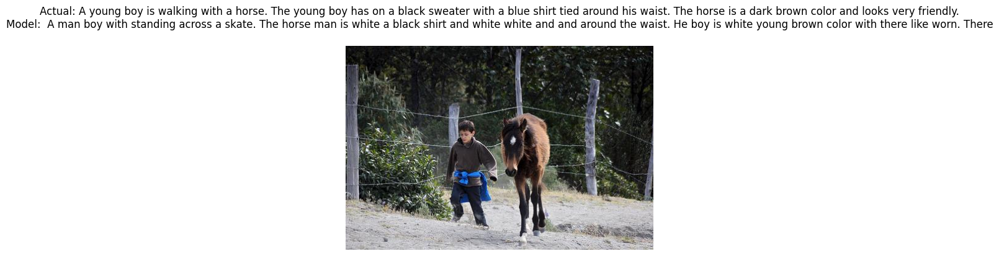

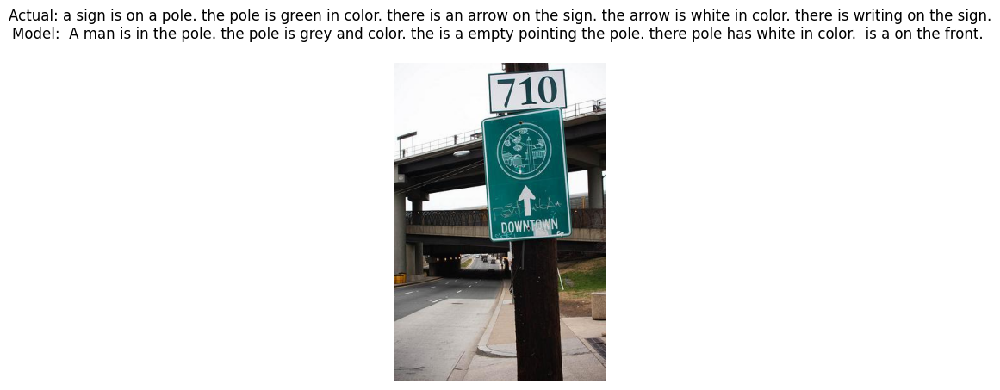

In [18]:
test_data = pd.read_csv('/kaggle/input/image-captioning/custom_captions_dataset/test.csv')
for i, row in test_data.iterrows():
    test_img, test_caption = row[1], row[2]
    gen_caption = y_pred[i]  # Assuming y_pred contains model predictions
    img_path = '/kaggle/input/image-captioning/custom_captions_dataset/test/' + test_img
    
    if i < 50:
        plt.imshow(Image.open(img_path).convert('RGB'))
        plt.title(f"Actual: {test_caption}\nModel: {gen_caption}\n")
        plt.axis('off')
        plt.show()

In [19]:
pickle.dump(y_test, open('y_test.pkl', 'wb'))
pickle.dump(y_pred, open('y_pred.pkl', 'wb'))

In [20]:
!pip install pycocoevalcap
!pip install rouge-score

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.3/104.3 MB 15.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 426.2/426.2 kB 24.9 MB/s eta 0:00:00


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


  Preparing metadata (setup.py) ... - done
  Created wheel for rouge-score: filename=rouge_score-0.1.2-py3-none-any.whl size=24934 sha256=8599bcad7a7d75b6f57b0a1087b64a785692cd440d06aa160b81744534f0bc55
  Stored in directory: /root/.cache/pip/wheels/5f/dd/89/461065a73be61a532ff8599a28e9beef17985c9e9c31e541b4
Successfully built rouge-score


In [21]:
# Evaluation metrics:
from pycocoevalcap.cider.cider import Cider
from pycocoevalcap.spice.spice import Spice
from rouge_score.rouge_scorer import RougeScorer

In [22]:
# Convert the lists to dictionaries
gts = {img_id: [caption] for img_id, caption in zip(list(range(len(test_loader))), y_test)}
res = {img_id: [caption] for img_id, caption in zip(list(range(len(test_loader))), y_pred)}

cider_scorer = Cider()
spice_scorer = Spice()
rouge_scorer = RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)

cider_score = cider_scorer.compute_score(gts, res)[0]
spice_score = spice_scorer.compute_score(gts, res)[0]


print(f"CIDEr score: {cider_score:.4f}")
print(f"SPICE score: {spice_score:.4f}")

Progress: 384.5M / 384.5M (100.0%)
Extracting stanford-corenlp-3.6.0 ...
Done.


Parsing reference captions
Initiating Stanford parsing pipeline
[main] INFO edu.stanford.nlp.pipeline.StanfordCoreNLP - Adding annotator tokenize
[main] INFO edu.stanford.nlp.pipeline.TokenizerAnnotator - TokenizerAnnotator: No tokenizer type provided. Defaulting to PTBTokenizer.
[main] INFO edu.stanford.nlp.pipeline.StanfordCoreNLP - Adding annotator ssplit
[main] INFO edu.stanford.nlp.pipeline.StanfordCoreNLP - Adding annotator parse
[main] INFO edu.stanford.nlp.parser.common.ParserGrammar - Loading parser from serialized file edu/stanford/nlp/models/lexparser/englishPCFG.ser.gz ... 
done [0.7 sec].
[main] INFO edu.stanford.nlp.pipeline.StanfordCoreNLP - Adding annotator lemma
[main] INFO edu.stanford.nlp.pipeline.StanfordCoreNLP - Adding annotator ner
Loading classifier from edu/stanford/nlp/models/ner/english.all.3class.distsim.crf.ser.gz ... done [1.3 sec].
Loading classifier from edu/stanford/nlp/models/ner/english.muc.7class.distsim.crf.ser.gz ... done [0.7 sec].
Loading classif

SPICE evaluation took: 1.101 min
CIDEr score: 0.7523
SPICE score: 0.1628


In [23]:
from datasets import load_metric

rouge = load_metric("rouge")

def compute_rouge(original, predicted):
    rouge_output = rouge.compute(predictions=y_pred, references=y_test, rouge_types=["rougeL"])["rougeL"].mid

    return {
        "rougeL_precision": round(rouge_output.precision, 4),
        "rougeL_recall": round(rouge_output.recall, 4),
        "rougeL_fmeasure": round(rouge_output.fmeasure, 4),
    }

rouge_scores = compute_rouge(y_test, y_pred)
print(rouge_scores)

{'rougeL_precision': 0.3776, 'rougeL_recall': 0.3738, 'rougeL_fmeasure': 0.3754}


In [24]:
import nltk
from nltk.translate.bleu_score import corpus_bleu

# Assuming original and predicted are lists of strings
# Each string represents a single caption
# You might need to preprocess your captions, tokenize them, and convert them into lists of tokens
# You can use NLTK's word_tokenize function for tokenization

original_tokenized = [nltk.word_tokenize(sentence.lower()) for sentence in y_test]
predicted_tokenized = [nltk.word_tokenize(sentence.lower()) for sentence in y_pred]

# Calculate BLEU score with unigram precision
bleu_score = corpus_bleu([[ref] for ref in original_tokenized], predicted_tokenized, weights=(1, 0, 0, 0))

print("BLEU Score (Unigram):", bleu_score)


BLEU Score (Unigram): 0.5293724936235135
